### Imports

In [1]:
# Python standard library
import csv
import sys

# Scientific computing
import numpy as np
import scipy
import scipy.interpolate

import matplotlib.pyplot as plt
%matplotlib inline

# Pore stats
sys.path.append('/home/prestonh/Desktop/Research/pore_stats/pore_stats/oi')
import optical_imaging as oi
import oi_file

## Velocity

In [9]:
velocitiess = []
rates = []


##############################################################################################################
date = '7-17-2017/'
particle = '293-T/'
channel = '15-30-15_1/'
file_indices = ['0']
rate = 0.01
rates.append(rate)
header_rows = 1

base_file_path = '../data/' + date + particle + channel
for file_index in file_indices:
    file_path = base_file_path + 'velocities_' + file_index
    
    with open(file_path, 'r') as file_handle:
        file_reader = csv.reader(file_handle, delimiter = '\t')

        for i in range(header_rows):
            row = file_reader.next()


        velocities = []
        for row in file_reader:
            if row[0] == 'event #':
                pass
            else:
                velocity = float(row[0])
                velocities.append(velocity)
                
        velocitiess.append(velocities)
        
        
##############################################################################################################
date = '7-17-2017/'
particle = '293-T/'
channel = '15-30-15_6/'
file_indices = ['0']
rate = 0.01
rates.append(rate)
header_rows = 1

base_file_path = '../data/' + date + particle + channel
for file_index in file_indices:
    file_path = base_file_path + 'velocities_' + file_index
    
    with open(file_path, 'r') as file_handle:
        file_reader = csv.reader(file_handle, delimiter = '\t')

        for i in range(header_rows):
            row = file_reader.next()


        velocities = []
        for row in file_reader:
            if row[0] == 'event #':
                pass
            else:
                velocity = float(row[0])
                velocities.append(velocity)
                
        velocitiess.append(velocities)


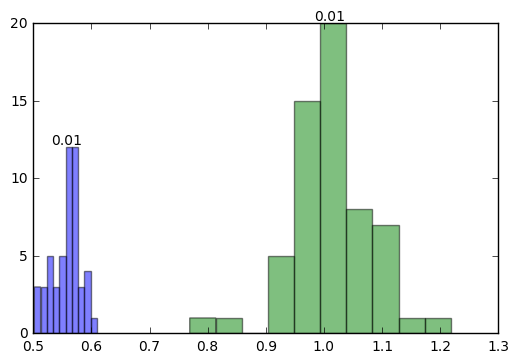

In [10]:
for i, velocities in enumerate(velocitiess):
    hist = plt.hist(velocities, bins = 10, alpha = 0.5)
    plt.text(np.mean(velocities), np.max(hist[0]), rates[i], ha = 'center', va = 'bottom')
plt.show()    

# Ellipse fits plot

### Load data

In [2]:
date = '7-17-2017/'
particle = '293-T/'
channel = '15-30-15_1/'
file_index = '0'

base_path = '/home/prestonh/Desktop/Research/cancer_cells/data/'

oi_vid_file_path = base_path + date + particle + channel + 'oi/bin/test_camera_' + file_index
oi_events_file_path = base_path + date + particle + channel + 'oi/events/test_camera_' + file_index + '_events.json'

In [3]:
# Load video
oi_res_x = 512
oi_res_y = 288
oi_fps = 100000.
oi_vid = oi_file.Video(oi_vid_file_path, oi_res_x, oi_res_y, oi_fps)

# Load events
oi_events = oi_file.open_event_file_json(oi_events_file_path)

/home/prestonh/Desktop/Research/pore_stats/pore_stats/oi/optical_imaging.py:63: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if pixels != None:


### Load stage

[-0.  1.]


/home/prestonh/Desktop/Research/pore_stats/pore_stats/oi/optical_imaging.py:429: RuntimeWarning: divide by zero encountered in double_scalars
  plt.plot([x, x + image_height/(self._norm_y[1]/self._norm_y[0])], [0, image_height], ls = '--', color = 'yellow')


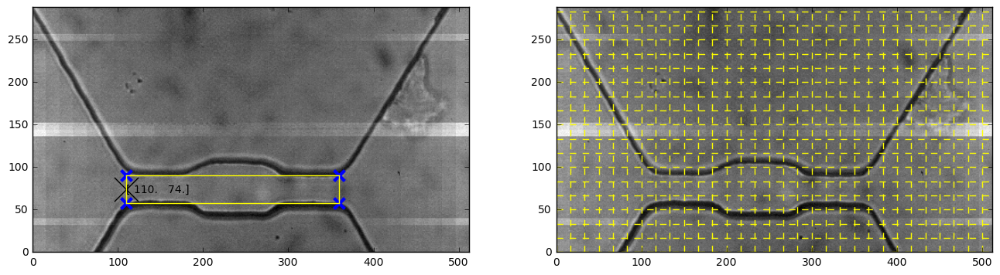

In [4]:
template_index = 250

reload(oi)
template_frame = oi_vid.get_frame(template_index)
c0 = [110,90]
c1 = [110,58]
c2 = [360,58]
c3 = [360,90]
oi_stage = oi.Stage(template_frame, c0, c1, c2, c3)
oi_stage.plot_stage()

### Ellipses

In [5]:
oi_ellipse_base_path = '../data/'
oi_ellipse_path = oi_ellipse_base_path + date + particle + channel + 'ellipses_' + file_index

ellipsess = []


with open(oi_ellipse_path, 'r') as file_handle:
    file_reader = csv.reader(file_handle, delimiter = '\t')
    
    # Skip header
    header_length = 2
    for i in range(header_length):
        next(file_reader)
        
        
    for row in file_reader:
        
        if row[0] == 'event #':
            # New event
            ellipsess.append([])
            continue
            
        else:
            ellipse = []
            for ele in row:
                try:
                    ellipse.append(float(ele))
                except:
                    ellipse.append(0)
                    
            ellipsess[-1].append(ellipse)

##### Filter

In [6]:
# Load keep indices
filter_file_path = '../data/' + date + particle + channel + 'filter_' + file_index

with open(filter_file_path, 'r') as filter_file_handle:
    filter_file_reader = csv.reader(filter_file_handle, delimiter = '\t')
    for row in filter_file_reader:
        if row[0] == 'events':
            keep_indices = [int(ele) for ele in row[1:]]

print 'loaded keep indices (', len(keep_indices), 'events total):\n', keep_indices

loaded keep indices ( 45 events total):
[0, 7, 10, 15, 18, 19, 22, 24, 25, 31, 34, 40, 41, 45, 47, 49, 52, 56, 59, 63, 64, 66, 71, 72, 78, 80, 81, 86, 87, 91, 98, 100, 102, 108, 109, 112, 114, 115, 123, 125, 126, 138, 140, 147, 154]


In [7]:
filtered_oi_events = [oi_events[i] for i in range(len(oi_events)) if i in keep_indices]
filtered_ellipsess = [ellipsess[i] for i in range(len(ellipsess)) if i in keep_indices]

### Plot

In [8]:
output_file_path = '../data/' + date + particle + channel + 'ellipse_fits/ellipse_fits_' + file_index + '_'

0
137.077646997 77.9664312315 12.8639747079 9.88321173751 -0.0878974114153
169.389797274 76.9028908771 12.248438234 10.0097753098 0.00655861158908
206.397568303 79.5199359454 10.7416603053 11.0695735074 0.423534677431
228.026665146 79.7320339753 10.8698040589 10.623135875 -0.626419910031
256.51809463 80.1918464495 11.0623774421 10.1382354791 -0.783363892254
277.918596989 78.1820875099 9.74748520787 10.8388450995 0.432661707374
319.151351906 75.4723472052 12.2476733093 10.0651082394 -0.262540891374
352.082362841 76.2729265272 12.8674388187 10.0278544728 -0.223623442287
387.818927465 78.7152625764 12.7058560369 10.3916979094 -0.302001439991


/home/prestonh/anaconda3/envs/py27/lib/python2.7/site-packages/ipykernel/__main__.py:92: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


1
134.124798616 77.4431414025 15.2259241162 9.98619449989 -0.0312091067682
167.399655467 76.9183681081 13.9478314712 10.2661216861 -0.0421483196761
199.157197501 78.3246245289 14.2593518404 11.3728269046 -0.0709789175091
230.757707647 79.4888165519 13.3897437033 11.5812143114 0.0102255279795
253.34780266 79.9778904003 13.8383746275 11.2672285327 -0.133491102901
275.509325882 77.987438059 13.2713888205 11.3086102814 -0.293387211742
305.464891154 75.5978660636 15.337570735 10.6149954459 -0.126641800006
351.132096484 75.9392260236 14.4541198474 10.7099850208 -0.161431955452
380.987544099 77.7203245371 13.3449367658 11.6262816808 -0.510099525683
2
132.044532345 72.8886708672 14.2480457333 8.15437719844 -0.0250024220067
167.78782122 72.792455447 13.6737210278 8.17694793564 -0.0136369982608
199.536280329 72.3284655848 11.6694305977 9.32946595738 -0.0218249039128
224.743838611 72.4453232054 11.4120280078 9.56204406726 -0.0607567154736
248.002586966 71.1715738171 11.6784951339 9.38977270225 -0

/home/prestonh/anaconda3/envs/py27/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


129.613621522 79.3667575958 14.7673517475 9.27980358424 -0.0244205111338
171.95626143 78.1746424141 13.1022891456 9.71158488366 0.0453020155507
200.145054103 80.0980946435 12.1016893776 10.9512040078 -0.285721541024
228.571225366 82.619572575 11.5729583716 11.2291289298 -0.510010093017
248.718252388 82.1630540949 10.8878518168 11.7134409426 0.743896549764
276.308938709 80.1831465958 9.89917186267 11.7424413628 0.597967269193
313.515479725 76.3365012076 12.3991506674 9.00721590041 -0.447925354487
345.914093957 76.3337574908 13.3984123915 8.77321423699 -0.423490160202
383.277198852 79.534191564 13.8548360068 9.19181883794 -0.515139796133
21
135.708675531 72.5213151794 19.9895378523 14.6835877158 -0.34668523401
172.913541951 74.9666572514 14.7736934752 21.3602015419 0.256464961218
199.768429846 78.3485830958 14.4958621649 18.9182835039 -0.43461191496
227.466139188 70.9566962926 14.1988950967 19.9069947681 0.164323386649
254.38769908 76.8349574226 19.4122092188 22.7975536183 0.20178175088


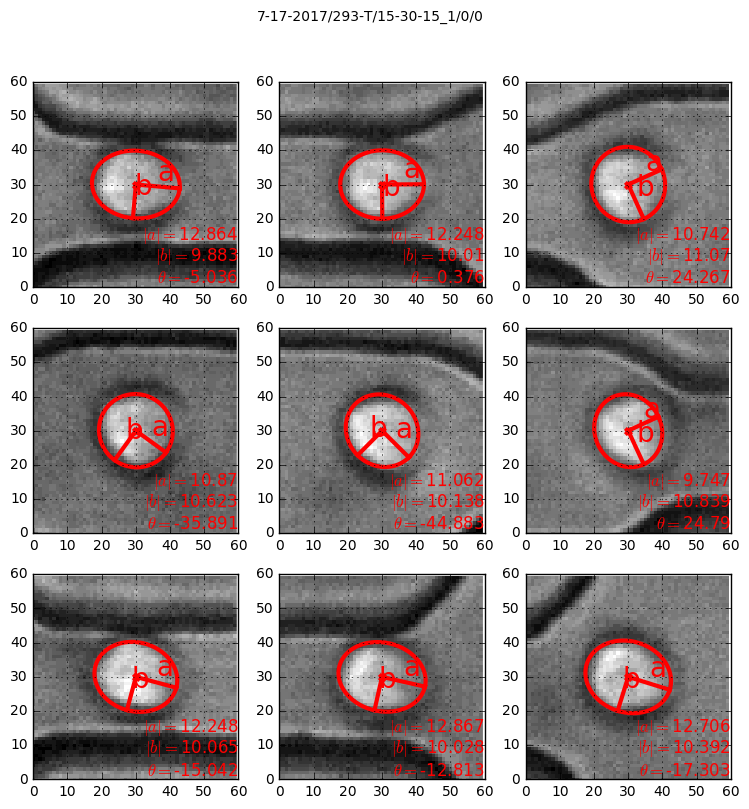

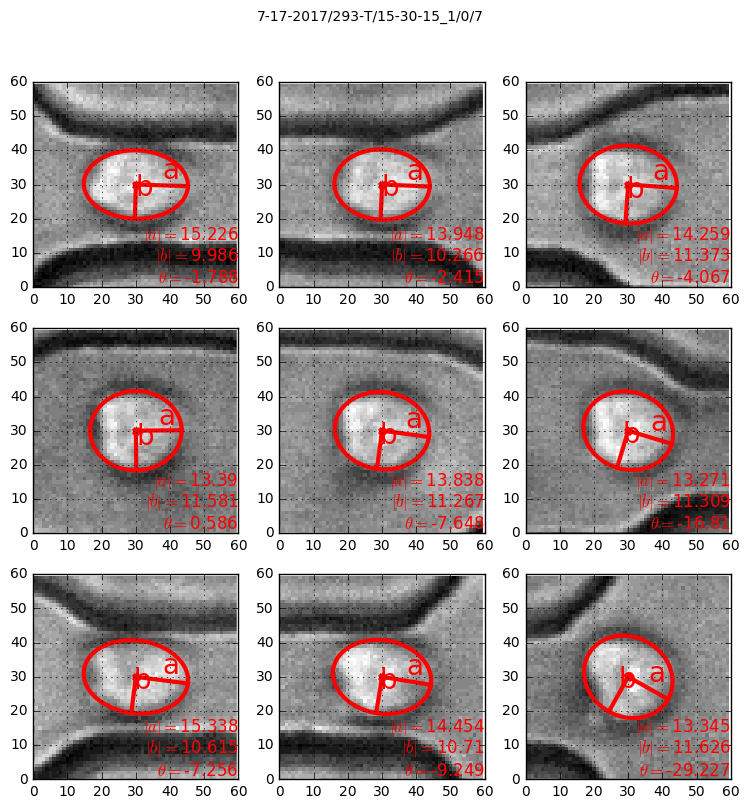

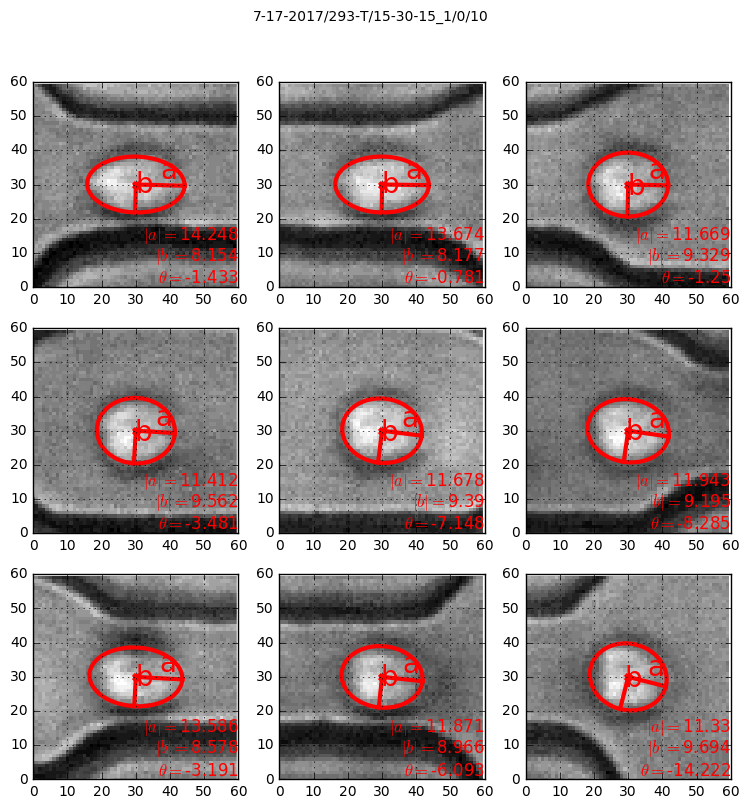

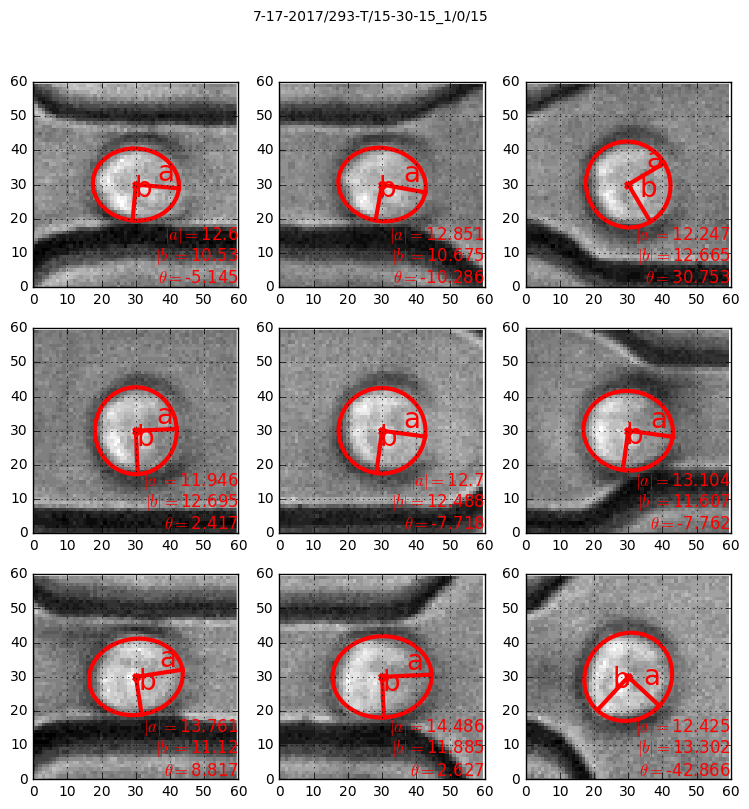

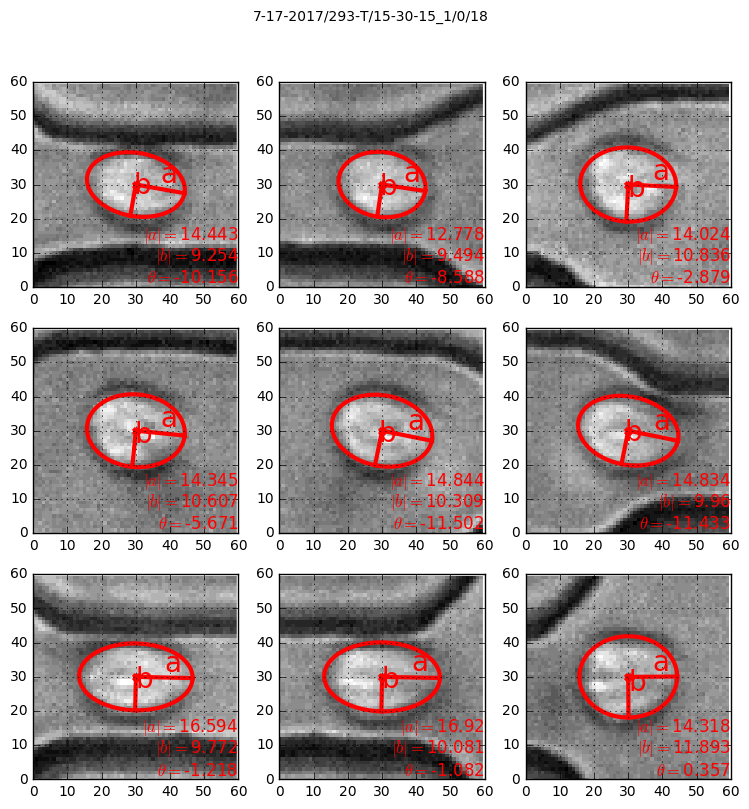

...

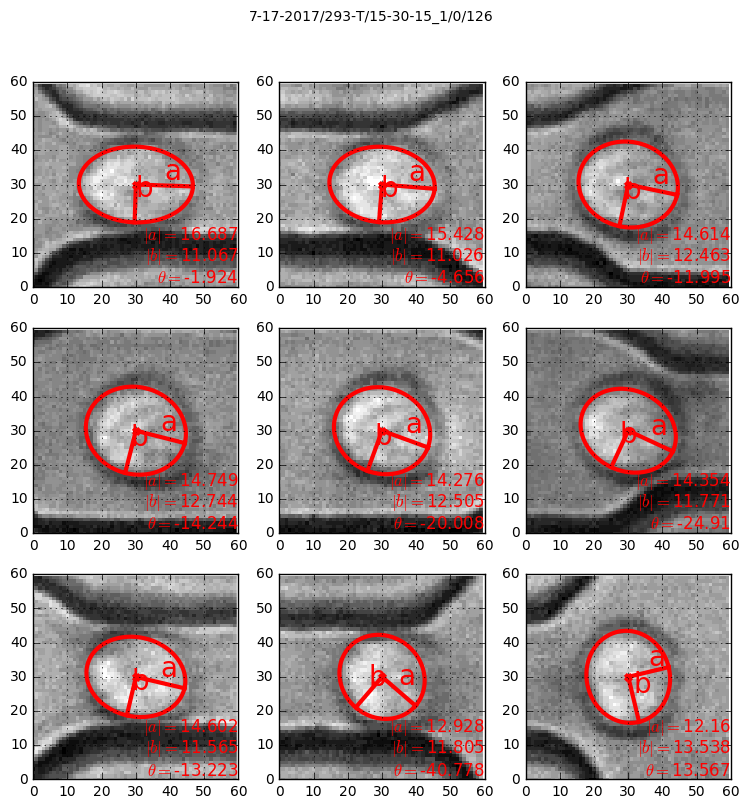

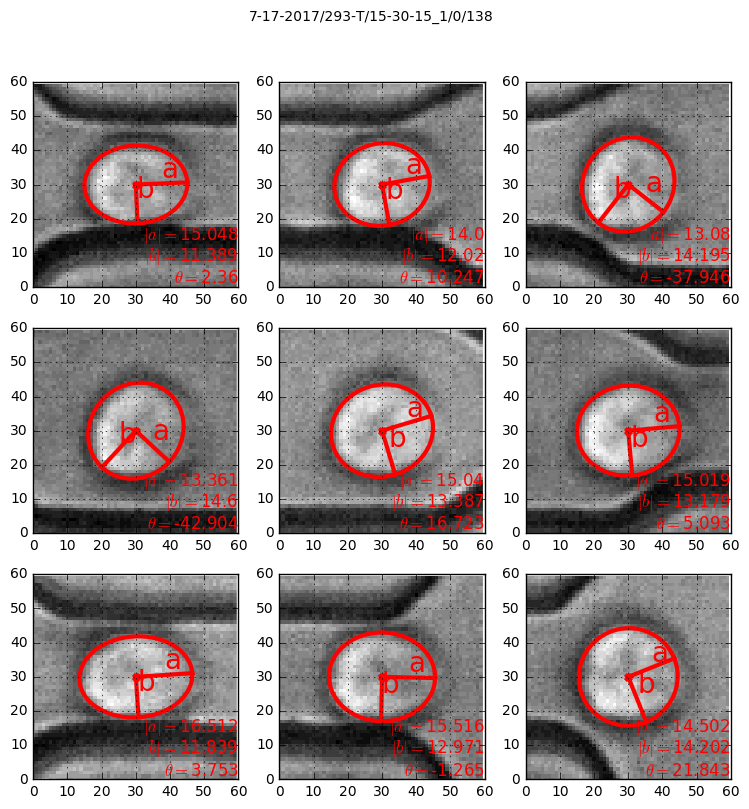

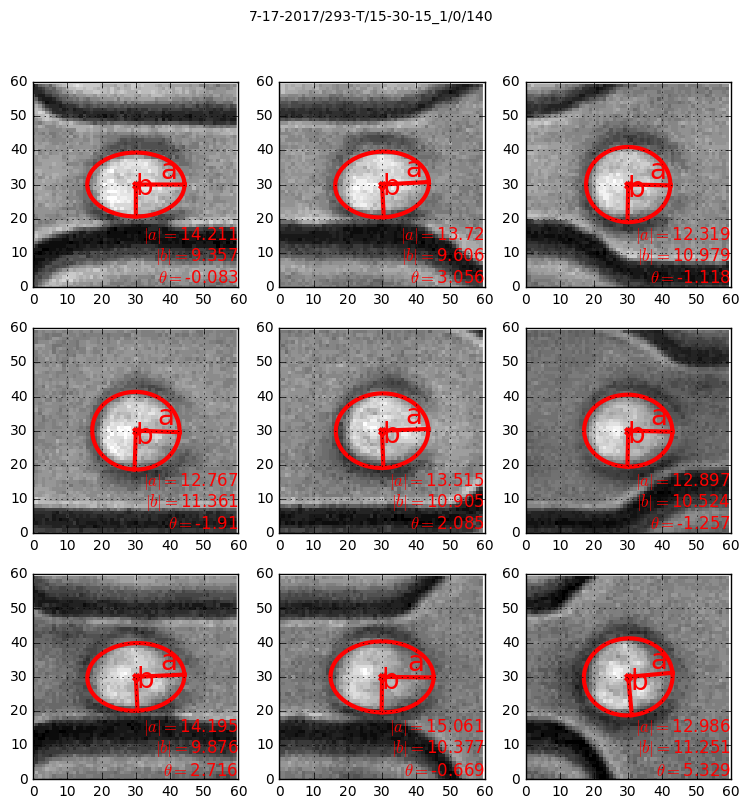

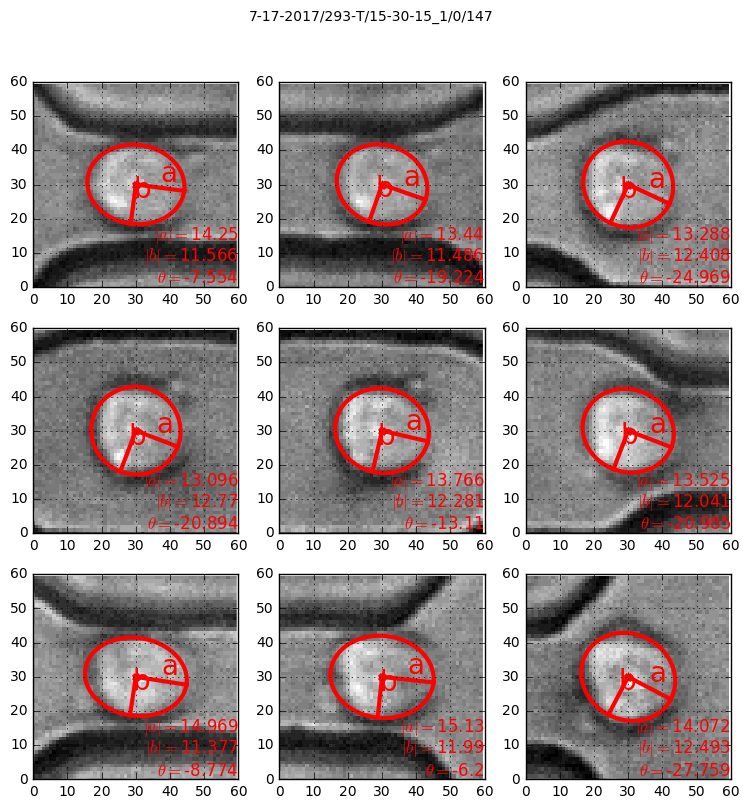

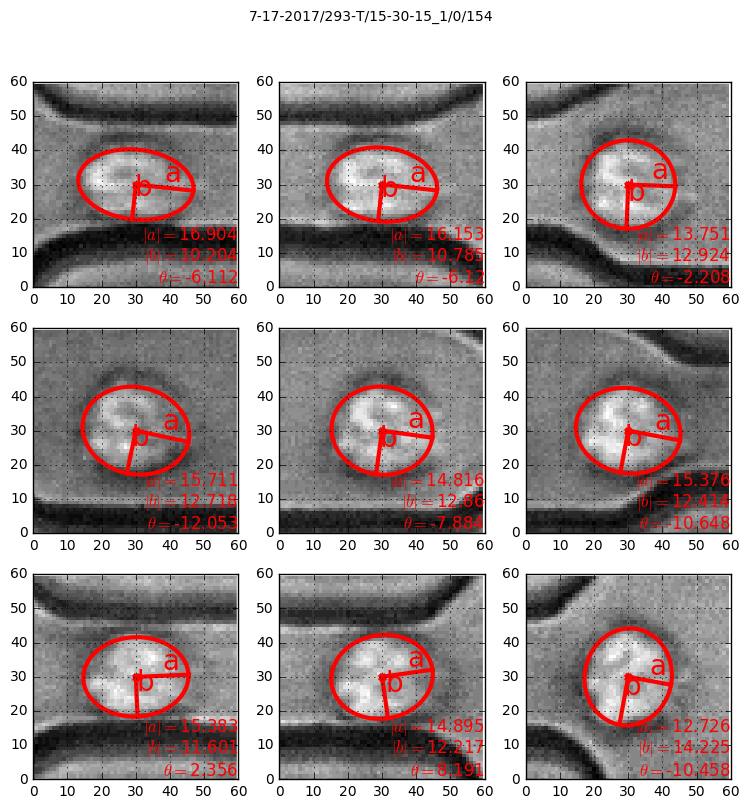

In [13]:
'''
BUG! 
This function won't work if there are gaps in ts...
In other words, if the ellipse fit for whatever reason doesn't work for one or more frames during the
translocation, this will probably break
The break should be evident
'''



for i in range(len(filtered_oi_events)):
    
    print i

    
    
    
    oi_event = filtered_oi_events[i]
    ellipses = filtered_ellipsess[i]
    
    # Get frame indices
    ts = [ellipse[0] for ellipse in ellipses]
    xs = [ellipse[1] for ellipse in ellipses]
    ys = [ellipse[2] for ellipse in ellipses]
    
    xcs, ycs = oi_stage.get_channel_coordinates(xs, ys)
    xcs = oi_stage.pixels_to_meters(xcs)

    
    ts_interp = scipy.interpolate.interp1d(xcs, ts)
    
    dt = ts_interp(oi_stage._length_microns) - ts_interp(0)
    
    

    
    detection_indices = [int(ts_interp(0)) + int((l+1)*dt/8.) for l in range(9)]
    
    frame_indices = [detection._tf for detection in np.array(oi_event._detections)[detection_indices]]
    
        
    fig, axes = plt.subplots(3,3, figsize = [9,9])
    for j in range(9):
        
        # Get ellipse
        detection_index = detection_indices[j] - int(ts[0])
        
        
        ellipse = ellipses[detection_index]
        
        # Get frame
        frame_index = frame_indices[j]
        frame = oi_vid.get_frame(frame_index)
        
        
        
        # Default value since ellipse is always centered in these plots
        ellipse_center = [30,30]
        
        
        # Set ellipse parameters
        x = ellipse[1]
        y = ellipse[2]
        ellipse_axes_lengths = [ellipse[3], ellipse[4]]
        
        # Cover case where axes are incorrect
        if np.isnan(ellipse_axes_lengths[0]):
            ellipse_axes_lengths[0] = 0
        if np.isnan(ellipse_axes_lengths[1]):
            ellipse_axes_lengths[1] = 0
        
        
        ellipse_angle = ellipse[5]
        
        
        #print x, y, ellipse_axes_lengths[0], ellipse_axes_lengths[1], ellipse_angle
        
        
        # Plot
        fig.sca(axes[j/3, j%3])
        
        
        # Create perimeter line
        ellipse_points = np.empty((100,2))
        for k in range(100):
            angle = k*2*np.pi/99.
            x_temp = ellipse_axes_lengths[0]*np.cos(angle)
            y_temp = ellipse_axes_lengths[1]*np.sin(angle)
            ellipse_points[k,0] = ellipse_center[0] + np.cos(ellipse_angle)*x_temp + np.sin(ellipse_angle)*y_temp
            ellipse_points[k,1] = ellipse_center[1] + np.sin(ellipse_angle)*x_temp - np.cos(ellipse_angle)*y_temp

        plt.imshow(frame[y-30:y+30, x-30:x+30], cmap = 'gray', origin = 'lower', interpolation = 'none')
        plt.plot(ellipse_points[:,0], ellipse_points[:,1], lw = 3, c = 'red')
        plt.scatter(ellipse_center[0], ellipse_center[1], marker = 'x', c = 'red', lw = 3, s = 20)
        
        
        ellipse_axis_a = [ellipse_axes_lengths[0]*np.cos(ellipse_angle), ellipse_axes_lengths[0]*np.sin(ellipse_angle)]
        ellipse_axis_b = [ellipse_axes_lengths[1]*np.sin(ellipse_angle), -ellipse_axes_lengths[1]*np.cos(ellipse_angle)]

        
        ax0 = ellipse_center[0]
        ax1 = ax0 + ellipse_axis_a[0]
        ay0 = ellipse_center[1]
        ay1 = ay0 + ellipse_axis_a[1]
        
        bx0 = ellipse_center[0]
        bx1 = bx0 + ellipse_axis_b[0]
        by0 = ellipse_center[1]
        by1 = by0 + ellipse_axis_b[1]
        
        plt.plot([ax0, ax1], [ay0, ay1], lw = 3, c = 'red')
        plt.plot([bx0, bx1], [by0, by1], lw = 3, c = 'red')
        
        plt.text((ax0+ax1)/2., (ay0+ay1)/2., 'a', color = 'red', size = 20, ha = 'left', va = 'bottom')
        plt.text((bx0+bx1)/2., (by0+by1)/2., 'b', color = 'red', size = 20, ha = 'left', va = 'bottom')
        
        plt.text(1, 0.2, r'$|a|=$'+str(round(ellipse_axes_lengths[0],3)), transform=plt.gca().transAxes, ha = 'right', va = 'bottom', size = 12, color = 'red')
        plt.text(1, 0.1, r'$|b|=$'+str(round(ellipse_axes_lengths[1],3)), transform=plt.gca().transAxes, ha = 'right', va = 'bottom', size = 12, color = 'red')

        plt.text(1, 0, r'$\theta=$'+str(round(ellipse_angle*180./np.pi,3)), transform=plt.gca().transAxes, ha = 'right', va = 'bottom', size = 12, color = 'red')
        
        
        plt.xlim(0,60)
        plt.ylim(0,60)
        
        plt.suptitle(date + particle + channel + file_index + '/' + str(keep_indices[i]))

        plt.grid()      
        
        
    plt.savefig(output_file_path + str(keep_indices[i]) + '.png', dpi = 100)
    
    #plt.show()
        

### print len(ellipses)

In [54]:
print ts_interp(0)

35.8183472619
